In [40]:
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import os
import sys
import scipy
import matplotlib
from matplotlib import rcParams
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all" # to show output from all the lines in a cells
pd.set_option('display.max_column',None) # display all the columns in pandas
pd.options.display.max_rows = 100
rcParams['pdf.fonttype'] = 42
sc.settings.figdir = './figures/CoE_integration/'
sc.settings.set_figure_params(dpi = 150, color_map = 'RdPu', dpi_save = 600, vector_friendly = True, format = 'pdf')

In [41]:
def Barplot(which_var, adata, var='clusters', height=3, color = False):
    plotdata = pd.crosstab(adata.obs[var], adata.obs[which_var], normalize='index') * 100
    if 'category' in plotdata.index.dtype.name:
        plotdata.index.reorder_categories(adata.obs[var].cat.categories[::-1])

    if not color:
        ax1 = plotdata.plot.barh(stacked = True, edgecolor = 'none', zorder = 3, figsize = (6,height), fontsize = 14, grid = False)
    else:
        ax1 = plotdata.plot.barh(stacked = True, edgecolor = 'none', zorder = 3, figsize = (6,height), fontsize = 14, grid = False, color = color)
    ax1.set_title(which_var+' %')
    ax1.set_ylabel(var)
    horiz_offset = 1
    vert_offset = 1.
    ax1 = ax1.legend(bbox_to_anchor = (horiz_offset, vert_offset))
#     ax1.figure.savefig(str(sc.settings.figdir)+'/barplot_'+var+'_proportions_'+which_var+'.pdf', bbox_inches='tight',
#                        dpi=300, orientation='landscape', format= 'pdf', optimize=True)

In [42]:
cd F:\PROJECTS\PROJECT_HUMAN_FETAL_COCHLEAE\WORKPLACE\R\sc_pipeline\

F:\PROJECTS\PROJECT_HUMAN_FETAL_COCHLEAE\WORKPLACE\R\sc_pipeline


G:\Miniconda3\envs\omicverse\lib\site-packages\IPython\core\magics\osm.py:417: UserWarning: This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


In [43]:
data_dir = '/PROJECTS/PROJECT_HUMAN_FETAL_COCHLEAE/WORKPLACE/R/sc_pipeline/'
meta = pd.read_csv(data_dir+'metadata.csv',index_col=0)
meta

,sample_id,donor,gw,gender,10xKit,sequencing,dataset
sample,,,,,,,
9.5gw,gw9,not_provided_1,9,female,SC3,snRNA-seq,public
11.2gw,gw11,not_provided_2,11,male,SC3,snRNA-seq,public
14+3gw,gw14,F20240701,14,male,SC3,snRNA-seq,in-house
15gw,gw15,not_provided_3,15,female,SC3,scRNA-seq,public
16+4gw,gw16,F20241018,16,male,SC3,snRNA-seq,in-house
17+2gw,gw17_1,F20220807,17,male,SC3,snRNA-seq,in-house
17+3gw,gw17_2,F20240928,17,female,SC3,snRNA-seq,in-house
17gw,gw17_3,not_provided_4,17,male,SC3,scRNA-seq,public
18+3gw,gw18,F20220806,18,male,SC3,snRNA-seq,in-house


In [44]:
adata_coe_final=sc.read('human_cochlea_coe_final_v2_raw.h5ad')
adata_coe_final

AnnData object with n_obs × n_vars = 9071 × 20780
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_counts', 'scrublet_score', 'scrublet_score_z', 'cluster_scrublet_score', 'bh_doublet_pval', 'scrublet_done', 'nCount_RNA', 'nFeature_RNA', 'leiden_R', 'sample_id', 'donor', 'gw', 'gender', '10xKit', 'sequencing', 'dataset', 'cell_type_final', 'leiden_scanvi_2.0'
    var: 'Gene', 'mt', 'gene_ids-gw11', 'feature_types-gw11', 'n_cells_by_counts-gw11', 'mean_counts-gw11', 'pct_dropout_by_counts-gw11', 'total_counts-gw11', 'highly_variable-gw11', 'means-gw11', 'dispersions-gw11', 'dispersions_norm-gw11', 'gene_ids-gw14', 'feature_types-gw14', 'n_cells_by_counts-gw14', 'mean_counts-gw14', 'pct_dropout_by_counts-gw14', 'total_counts-gw14', 'highly_variable-gw14', 'means-gw14', 'dispersions-gw14', 'dispersions_norm-gw14', 'genome-gw14', 'n_cells_by_counts-gw15', 'mean_counts-gw15', 'pct_dropout_by_counts-gw15

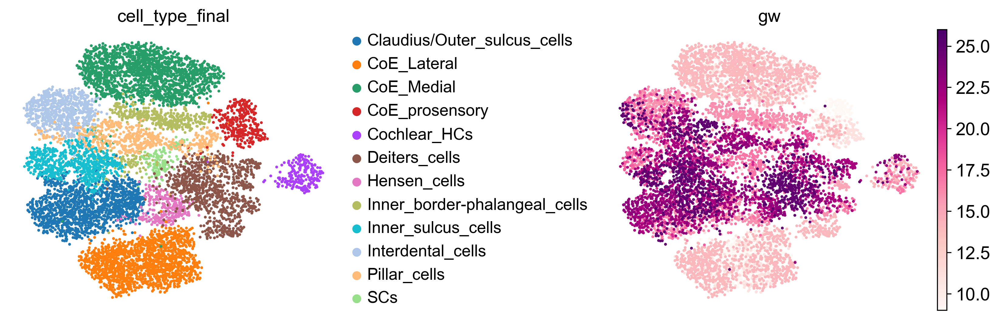

In [45]:
sc.set_figure_params(figsize=(4,4),frameon=False,dpi=150,dpi_save=600)
sc.pl.umap(adata_coe_final, color=['cell_type_final','gw',],size=20,
           wspace=0.65,ncols=2,color_map = "RdPu")

In [48]:
# isolate prosensory domain and its derived cell-types.
adata_coe=adata_coe_final[adata_coe_final.obs['cell_type_final'].isin(['Hensen_cells',
                                                        'Deiters_cells','Pillar_cells','Inner_border-phalangeal_cells',
                                                   'Cochlear_HCs','CoE_prosensory'
                                                           ]
    
)]
adata_coe

View of AnnData object with n_obs × n_vars = 2814 × 20780
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_counts', 'scrublet_score', 'scrublet_score_z', 'cluster_scrublet_score', 'bh_doublet_pval', 'scrublet_done', 'nCount_RNA', 'nFeature_RNA', 'leiden_R', 'sample_id', 'donor', 'gw', 'gender', '10xKit', 'sequencing', 'dataset', 'cell_type_final', 'leiden_scanvi_2.0'
    var: 'Gene', 'mt', 'gene_ids-gw11', 'feature_types-gw11', 'n_cells_by_counts-gw11', 'mean_counts-gw11', 'pct_dropout_by_counts-gw11', 'total_counts-gw11', 'highly_variable-gw11', 'means-gw11', 'dispersions-gw11', 'dispersions_norm-gw11', 'gene_ids-gw14', 'feature_types-gw14', 'n_cells_by_counts-gw14', 'mean_counts-gw14', 'pct_dropout_by_counts-gw14', 'total_counts-gw14', 'highly_variable-gw14', 'means-gw14', 'dispersions-gw14', 'dispersions_norm-gw14', 'genome-gw14', 'n_cells_by_counts-gw15', 'mean_counts-gw15', 'pct_dropout_by_cou

In [49]:
# isolate prosensory domain and its derived cell-types.
adata_medial=adata_coe_final[adata_coe_final.obs['cell_type_final'].isin(['Inner_sulcus_cells','Interdental_cells',
                                                        
                                                   'CoE_Medial'
                                                           ]
    
)]
adata_medial

View of AnnData object with n_obs × n_vars = 3141 × 20780
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_counts', 'scrublet_score', 'scrublet_score_z', 'cluster_scrublet_score', 'bh_doublet_pval', 'scrublet_done', 'nCount_RNA', 'nFeature_RNA', 'leiden_R', 'sample_id', 'donor', 'gw', 'gender', '10xKit', 'sequencing', 'dataset', 'cell_type_final', 'leiden_scanvi_2.0'
    var: 'Gene', 'mt', 'gene_ids-gw11', 'feature_types-gw11', 'n_cells_by_counts-gw11', 'mean_counts-gw11', 'pct_dropout_by_counts-gw11', 'total_counts-gw11', 'highly_variable-gw11', 'means-gw11', 'dispersions-gw11', 'dispersions_norm-gw11', 'gene_ids-gw14', 'feature_types-gw14', 'n_cells_by_counts-gw14', 'mean_counts-gw14', 'pct_dropout_by_counts-gw14', 'total_counts-gw14', 'highly_variable-gw14', 'means-gw14', 'dispersions-gw14', 'dispersions_norm-gw14', 'genome-gw14', 'n_cells_by_counts-gw15', 'mean_counts-gw15', 'pct_dropout_by_cou

In [50]:
# isolate prosensory domain and its derived cell-types.
adata_lateral=adata_coe_final[adata_coe_final.obs['cell_type_final'].isin(['Claudius/Outer_sulcus_cells',
                                                        
                                                   'CoE_Lateral'
                                                           ]
    
)]
adata_lateral

View of AnnData object with n_obs × n_vars = 2962 × 20780
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'cell_type', 'n_counts', 'scrublet_score', 'scrublet_score_z', 'cluster_scrublet_score', 'bh_doublet_pval', 'scrublet_done', 'nCount_RNA', 'nFeature_RNA', 'leiden_R', 'sample_id', 'donor', 'gw', 'gender', '10xKit', 'sequencing', 'dataset', 'cell_type_final', 'leiden_scanvi_2.0'
    var: 'Gene', 'mt', 'gene_ids-gw11', 'feature_types-gw11', 'n_cells_by_counts-gw11', 'mean_counts-gw11', 'pct_dropout_by_counts-gw11', 'total_counts-gw11', 'highly_variable-gw11', 'means-gw11', 'dispersions-gw11', 'dispersions_norm-gw11', 'gene_ids-gw14', 'feature_types-gw14', 'n_cells_by_counts-gw14', 'mean_counts-gw14', 'pct_dropout_by_counts-gw14', 'total_counts-gw14', 'highly_variable-gw14', 'means-gw14', 'dispersions-gw14', 'dispersions_norm-gw14', 'genome-gw14', 'n_cells_by_counts-gw15', 'mean_counts-gw15', 'pct_dropout_by_cou

In [51]:
adata_lateral.write('cochlea_lateral.h5ad',compression='gzip')

In [52]:
adata_medial.write('cochlea_medial.h5ad',compression='gzip')

In [53]:
adata_coe.write('cochlea_prosensory.h5ad',compression='gzip')

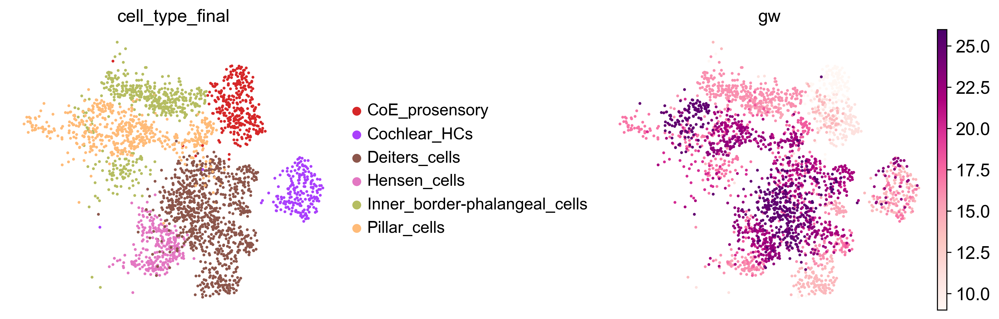

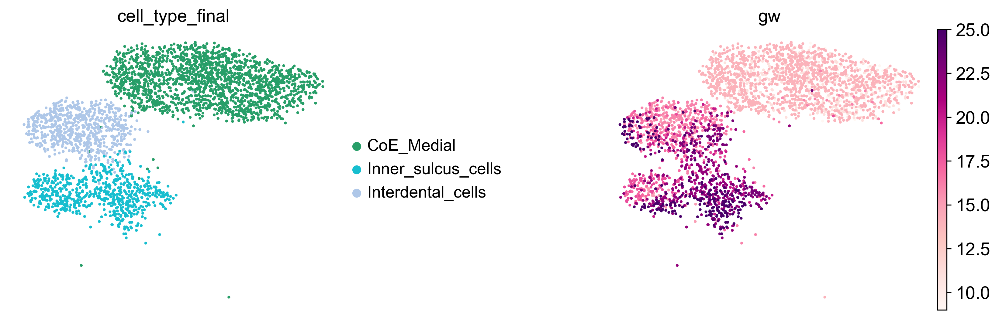

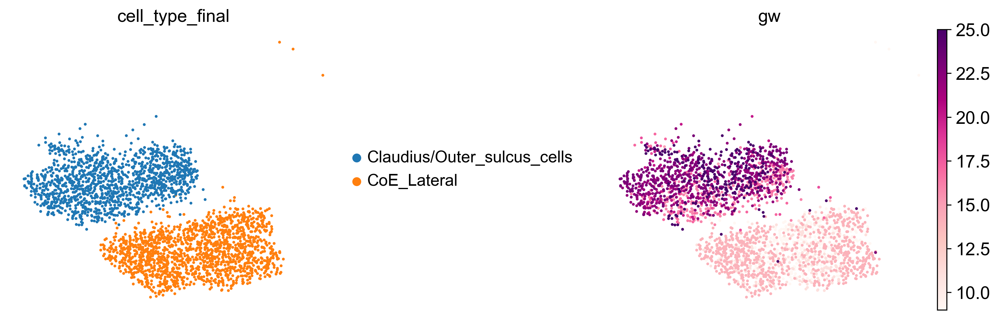

In [54]:
sc.set_figure_params(figsize=(4,4),frameon=False,dpi=150,dpi_save=600)
sc.pl.umap(adata_coe, color=['cell_type_final','gw',],size=20,
           wspace=0.65,ncols=2,color_map = "RdPu")
sc.pl.umap(adata_medial, color=['cell_type_final','gw',],size=20,
           wspace=0.65,ncols=2,color_map = "RdPu")
sc.pl.umap(adata_lateral, color=['cell_type_final','gw',],size=20,
           wspace=0.65,ncols=2,color_map = "RdPu")

In [55]:
import scvi

In [166]:
sc.pp.highly_variable_genes(
    adata_coe,
    n_top_genes=2000,
    subset=False,
    flavor="seurat_v3",
    batch_key="sample_id"
)

G:\Miniconda3\envs\omicverse\lib\site-packages\scanpy\preprocessing\_highly_variable_genes.py:75: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  warnings.warn(


In [167]:
sc.pp.normalize_per_cell(adata_coe, counts_per_cell_after=1e4)
sc.pp.log1p(adata_coe)

In [264]:
# ignore ccgenes analysis
def run_scvi(adata, batch_hv = "sample_id", batch_scvi = "gw", \
             cat_cov_scvi = ["sample_id",  "sequencing", "gender","dataset","cell_type"],  \
             cont_cov_scvi='percent_mito',
             include_genes = [], exclude_cc_genes=False, vae_name = "", **kwargs):
    adata_scvi = adata.copy()
    #adata_scvi.layers["counts"] = adata_scvi.X.copy()
    #sc.pp.normalize_total(adata_scvi, target_sum=1e4)
    #sc.pp.log1p(adata_scvi)
     # keep full dimension safe
    sc.pp.highly_variable_genes(adata_scvi, flavor="seurat_v3", n_top_genes=2000, layer="counts",\
                                batch_key=batch_hv)
    selected_genes = list(set(adata_scvi.var.loc[adata_scvi.var['highly_variable']].index.tolist()+ include_genes))
    print(len(selected_genes))

    adata_scvi = adata_scvi[:, selected_genes].copy()
    scvi.model.SCVI.setup_anndata(adata_scvi, layer="counts", batch_key=batch_scvi, \
                             categorical_covariate_keys=cat_cov_scvi,
                                  continuous_covariate_keys=cont_cov_scvi,
                             )
    scvi_kwargs = {k: v for k,v in kwargs.items() if k in scvi.model.SCVI.__init__.__code__.co_varnames}
    vae = scvi.model.SCVI(adata_scvi, **scvi_kwargs)
    train_kwargs = {k: v for k,v in kwargs.items() if k in vae.train.__code__.co_varnames}
    vae.train(**train_kwargs)
    adata_scvi.obsm["X_scVI"] = vae.get_latent_representation()
    
    
    return(adata_scvi)

In [270]:
adata_scvi = run_scvi(adata_coe, batch_hv = "sample_id", batch_scvi = "gw",
          cont_cov_scvi = ["pct_counts_mt"],cat_cov_scvi = [ "sequencing", "gender","dataset","sample_id",],            
               )
             #include_genes = marker_genes,)#cont_cov_scvi = ["percent_mito"],cat_cov_scvi = [ "sequencing", "gender","dataset","sample_id",],

G:\Miniconda3\envs\omicverse\lib\site-packages\scanpy\preprocessing\_highly_variable_genes.py:75: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  warnings.warn(
G:\Miniconda3\envs\omicverse\lib\site-packages\scvi\data\fields\_base_field.py:63: UserWarning: adata.layers[counts] does not contain unnormalized count data. Are you sure this is what you want?
  self.validate_field(adata)
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


2000


G:\Miniconda3\envs\omicverse\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:424: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=47` in the `DataLoader` to improve performance.


Training:   0%|          | 0/400 [00:00<?, ?it/s]

G:\Miniconda3\envs\omicverse\lib\site-packages\scvi\module\_vae.py:565: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
G:\Miniconda3\envs\omicverse\lib\site-packages\scvi\module\_vae.py:565: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
G:\Miniconda3\envs\omicverse\lib\site-packages\scvi\module\_vae.py:565: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
G:\Miniconda3\envs\omicverse\lib\site-packages\scvi\module\_vae.py:565: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
G:\Miniconda3\envs\omicverse\lib\site-packages\scvi\module\_vae.py:565: UserWarning: The

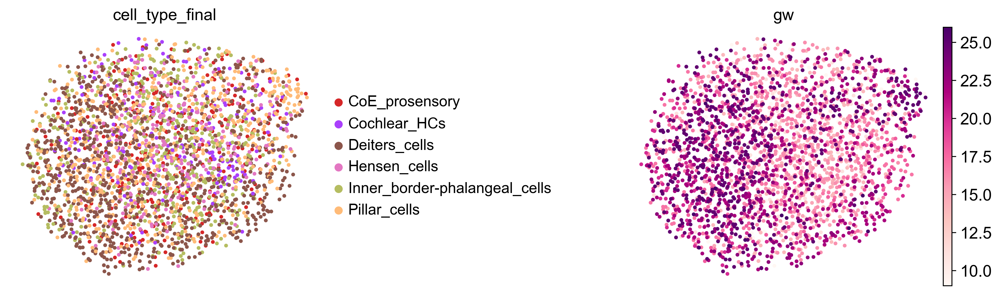

In [271]:
sc.pl.umap(adata_scvi, color=['cell_type_final', 'gw'], wspace=0.8)

In [272]:
sc.pp.neighbors(adata_scvi, use_rep="X_scVI")
sc.tl.leiden(adata_scvi)
sc.tl.umap(adata_scvi)

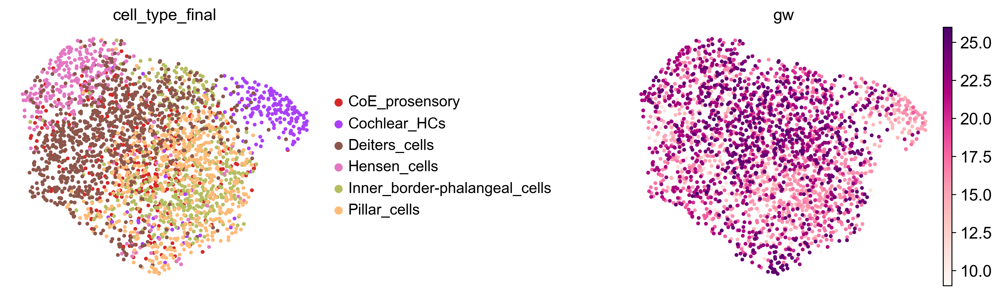

In [273]:
sc.pl.umap(adata_scvi, color=['cell_type_final', 'gw'], wspace=0.8)

In [274]:
#Save latent space
pd.DataFrame(adata_scvi.obsm["X_scVI"]).to_csv('human_prosensory_all_XscVI_latent_space.csv')

In [275]:
#Identify HVGs
sc.pp.highly_variable_genes(
    adata_coe,
    n_top_genes=2000,
    subset=False,
    flavor="seurat_v3",
    batch_key="sample_id"
)

G:\Miniconda3\envs\omicverse\lib\site-packages\scanpy\preprocessing\_highly_variable_genes.py:75: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  warnings.warn(


In [276]:
# subset object for latter
bdata = adata_coe[:, adata_coe.var['highly_variable']]
bdata.layers["counts"] = bdata.X.copy() # preserve counts

C:\Users\Dell\AppData\Local\Temp\ipykernel_41648\2978700728.py:3: ImplicitModificationWarning: Setting element `.layers['counts']` of view, initializing view as actual.
  bdata.layers["counts"] = bdata.X.copy() # preserve counts


In [277]:
#Normalized
sc.pp.normalize_per_cell(adata_coe, counts_per_cell_after=1e4)
sc.pp.log1p(adata_coe)

In [278]:
# use scVI latent space for UMAP generation
sc.pp.neighbors(adata_coe, use_rep="X_scVI",n_neighbors=30)
sc.tl.umap(adata_coe,min_dist=0.8)#, min_dist=0.4

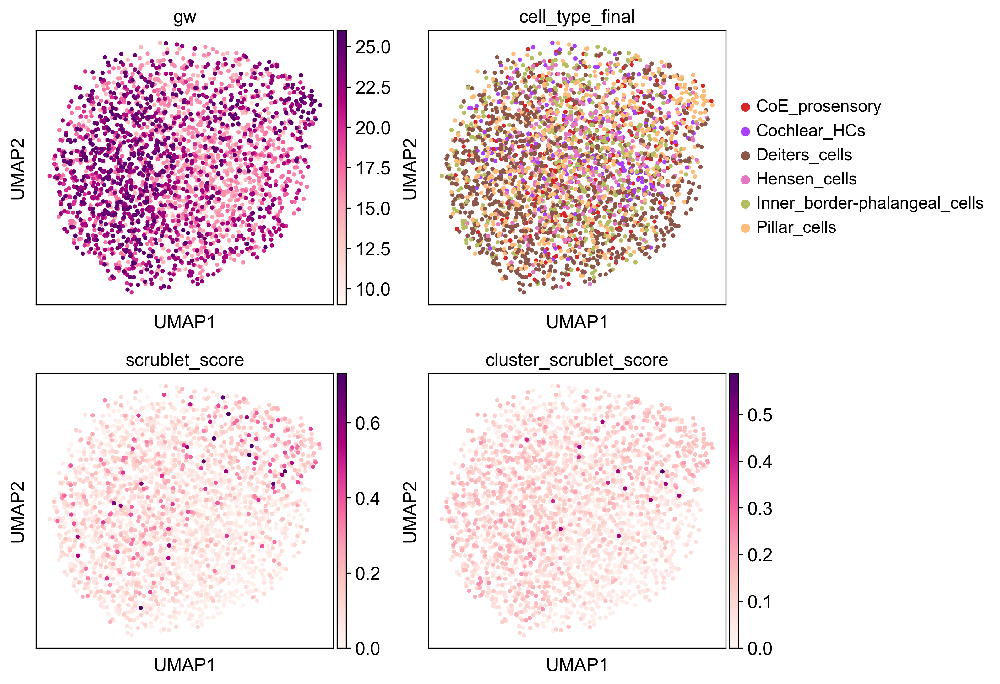

In [279]:
sc.pl.umap(
    adata_coe,
    color=['gw','cell_type_final', 'scrublet_score', 'cluster_scrublet_score',], 
    frameon=True, wspace = 0.2,ncols=2,
)

In [280]:
vae = scvi.model.SCVI(adata_scvi, n_layers=3, n_latent=30)
vae

SCVI model with the following parameters: 
n_hidden: 128, n_latent: 30, n_layers: 3, dropout_rate: 0.1, dispersion: gene, gene_likelihood: zinb, 
latent_distribution: normal.
Training status: Not Trained
Model's adata is minified?: False

In [281]:
vae.view_anndata_setup()

Anndata setup with scvi-tools version 1.2.0.

Setup via `SCVI.setup_anndata` with arguments:

{
│   'layer': 'counts',
│   'batch_key': 'gw',
│   'labels_key': None,
│   'size_factor_key': None,
│   'categorical_covariate_keys': ['sequencing', 'gender', 'dataset', 'sample_id'],
│   'continuous_covariate_keys': ['pct_counts_mt']
}

         Summary Statistics         
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━┓
┃     Summary Stat Key     ┃ Value ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━┩
│         n_batch          │  12   │
│         n_cells          │ 2814  │
│ n_extra_categorical_covs │   4   │
│ n_extra_continuous_covs  │   1   │
│         n_labels         │   1   │
│          n_vars          │ 2000  │
└──────────────────────────┴───────┘

                             Data Registry                             
┏━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Registry Key      ┃            scvi-tools Location             ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│           X            │           adata.layers['counts']           │
│         batch          │          adata.obs['_scvi_batch']          │
│ extra_categorical_covs │ adata.obsm['_scvi_extra_categorical_covs'] │
│ extra_continuous_covs  │ adata.obsm['_scvi_extra_continuous_covs']  │
│         labels         │         adata.obs['_scvi_labels']          │
└────────────────────────┴────────────────────────────────────────────┘

                 batch State Registry                 
┏━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃ Source Location ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['gw'] │     9      │          0          │
│                 │     11     │          1          │
│                 │     14     │          2          │
│                 │     15     │          3          │
│                 │     16     │          4          │
│                 │     17     │          5          │
│                 │     18     │          6          │
│                 │     20     │          7          │
│                 │     22     │          8          │
│                 │     23     │          9          │
│                 │     25     │         10          │
│                 │     26     │         11          │
└─────────────────┴────────────┴─────────────────────┘

                     labels State Registry                      
┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃      Source Location      ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['_scvi_labels'] │     0      │          0          │
└───────────────────────────┴────────────┴─────────────────────┘

            extra_categorical_covs State Registry             
┏━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃     Source Location     ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│  adata.obs['dataset']   │  in-house  │          0          │
│                         │   public   │          1          │
│                         │            │                     │
│   adata.obs['gender']   │   female   │          0          │
│                         │    male    │          1          │
│                         │            │                     │
│ adata.obs['sample_id']  │    gw9     │          0          │
│                         │    gw11    │          1          │
│                         │    gw14    │          2          │
│                         │    gw15    │          3          │
│                         │    gw16    │          4          │
│                         │   gw17_1   │          5          │
│                         │   gw17_2   │          6          │
│                         │   gw17_3   │          7          │
│                         │    gw18    │          8          │
│                         │    gw20    │          9          │
│                         │   gw22_1   │         10          │
│                         │   gw22_2   │         11          │
│                         │    gw23    │         12          │
│                         │    gw25    │         13          │
│                         │    gw26    │         14          │
│                         │            │                     │
│ adata.obs['sequencing'] │ scRNA-seq  │          0          │
│                         │ snRNA-seq  │          1          │
│                         │            │                     │
└─────────────────────────┴────────────┴─────────────────────┘

 extra_continuous_covs State  
           Registry           
┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Source Location       ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['pct_counts_mt'] │
└────────────────────────────┘

In [282]:
max_epochs_scvi = np.min([round((100000 / adata_scvi.n_obs) * 400), 400])
max_epochs_scvi

400

In [283]:
vae.train()

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
G:\Miniconda3\envs\omicverse\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:424: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=47` in the `DataLoader` to improve performance.


Training:   0%|          | 0/400 [00:00<?, ?it/s]

G:\Miniconda3\envs\omicverse\lib\site-packages\scvi\module\_vae.py:565: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
G:\Miniconda3\envs\omicverse\lib\site-packages\scvi\module\_vae.py:565: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
G:\Miniconda3\envs\omicverse\lib\site-packages\scvi\module\_vae.py:565: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
G:\Miniconda3\envs\omicverse\lib\site-packages\scvi\module\_vae.py:565: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -generative_outputs[MODULE_KEYS.PX_KEY].log_prob(x).sum(-1)
G:\Miniconda3\envs\omicverse\lib\site-packages\scvi\module\_vae.py:565: UserWarning: The

In [284]:
# Normally we would need to run scVI first but we have already done that here
# model_scvi = scvi.model.SCVI(adata_scvi) etc.
model_scanvi = scvi.model.SCANVI.from_scvi_model(
    vae, labels_key='cell_type_final', unlabeled_category="unlabelled"
)#unlabelled
print(model_scanvi)
model_scanvi.view_anndata_setup()

G:\Miniconda3\envs\omicverse\lib\site-packages\scvi\data\fields\_base_field.py:63: UserWarning: adata.layers[counts] does not contain unnormalized count data. Are you sure this is what you want?
  self.validate_field(adata)


ScanVI Model with the following params: 
unlabeled_category: unlabelled, n_hidden: 128, n_latent: 30, n_layers: 3, dropout_rate: 0.1, dispersion: gene, 
gene_likelihood: zinb
Training status: Not Trained
Model's adata is minified?: False

Anndata setup with scvi-tools version 1.2.0.

Setup via `SCANVI.setup_anndata` with arguments:

{
│   'labels_key': 'cell_type_final',
│   'unlabeled_category': 'unlabelled',
│   'layer': 'counts',
│   'batch_key': 'gw',
│   'size_factor_key': None,
│   'categorical_covariate_keys': ['sequencing', 'gender', 'dataset', 'sample_id'],
│   'continuous_covariate_keys': ['pct_counts_mt']
}

         Summary Statistics         
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━┓
┃     Summary Stat Key     ┃ Value ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━┩
│         n_batch          │  12   │
│         n_cells          │ 2814  │
│ n_extra_categorical_covs │   4   │
│ n_extra_continuous_covs  │   1   │
│         n_labels         │   7   │
│          n_vars          │ 2000  │
└──────────────────────────┴───────┘

                             Data Registry                             
┏━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Registry Key      ┃            scvi-tools Location             ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│           X            │           adata.layers['counts']           │
│         batch          │          adata.obs['_scvi_batch']          │
│ extra_categorical_covs │ adata.obsm['_scvi_extra_categorical_covs'] │
│ extra_continuous_covs  │ adata.obsm['_scvi_extra_continuous_covs']  │
│         labels         │         adata.obs['_scvi_labels']          │
└────────────────────────┴────────────────────────────────────────────┘

                 batch State Registry                 
┏━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃ Source Location ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['gw'] │     9      │          0          │
│                 │     11     │          1          │
│                 │     14     │          2          │
│                 │     15     │          3          │
│                 │     16     │          4          │
│                 │     17     │          5          │
│                 │     18     │          6          │
│                 │     20     │          7          │
│                 │     22     │          8          │
│                 │     23     │          9          │
│                 │     25     │         10          │
│                 │     26     │         11          │
└─────────────────┴────────────┴─────────────────────┘

                                labels State Registry                                 
┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃       Source Location        ┃          Categories           ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['cell_type_final'] │        CoE_prosensory         │          0          │
│                              │         Cochlear_HCs          │          1          │
│                              │         Deiters_cells         │          2          │
│                              │         Hensen_cells          │          3          │
│                              │ Inner_border-phalangeal_cells │          4          │
│                              │         Pillar_cells          │          5          │
│                              │          unlabelled           │          6          │
└──────────────────────────────┴───────────────────────────────┴─────────────────────┘

            extra_categorical_covs State Registry             
┏━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃     Source Location     ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│  adata.obs['dataset']   │  in-house  │          0          │
│                         │   public   │          1          │
│                         │            │                     │
│   adata.obs['gender']   │   female   │          0          │
│                         │    male    │          1          │
│                         │            │                     │
│ adata.obs['sample_id']  │    gw9     │          0          │
│                         │    gw11    │          1          │
│                         │    gw14    │          2          │
│                         │    gw15    │          3          │
│                         │    gw16    │          4          │
│                         │   gw17_1   │          5          │
│                         │   gw17_2   │          6          │
│                         │   gw17_3   │          7          │
│                         │    gw18    │          8          │
│                         │    gw20    │          9          │
│                         │   gw22_1   │         10          │
│                         │   gw22_2   │         11          │
│                         │    gw23    │         12          │
│                         │    gw25    │         13          │
│                         │    gw26    │         14          │
│                         │            │                     │
│ adata.obs['sequencing'] │ scRNA-seq  │          0          │
│                         │ snRNA-seq  │          1          │
│                         │            │                     │
└─────────────────────────┴────────────┴─────────────────────┘

 extra_continuous_covs State  
           Registry           
┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Source Location       ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['pct_counts_mt'] │
└────────────────────────────┘

In [285]:
max_epochs_scanvi = int(np.min([10, np.max([2, round(max_epochs_scvi / 3.0)])]))
model_scanvi.train(max_epochs=max_epochs_scanvi)

INFO     Training for 10 epochs.                                                                                   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
G:\Miniconda3\envs\omicverse\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:424: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=47` in the `DataLoader` to improve performance.


Training:   0%|          | 0/10 [00:00<?, ?it/s]

G:\Miniconda3\envs\omicverse\lib\site-packages\scvi\module\_scanvae.py:305: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -px.log_prob(x).sum(-1)
G:\Miniconda3\envs\omicverse\lib\site-packages\scvi\module\_scanvae.py:305: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -px.log_prob(x).sum(-1)
G:\Miniconda3\envs\omicverse\lib\site-packages\scvi\module\_scanvae.py:305: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -px.log_prob(x).sum(-1)
G:\Miniconda3\envs\omicverse\lib\site-packages\scvi\module\_scanvae.py:305: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -px.log_prob(x).sum(-1)
G:\Miniconda3\envs\omicverse\lib\site-packages\scvi\module\_scanvae.py:305: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -px.log_prob(x).sum(-1)
G:\Miniconda3\envs\o

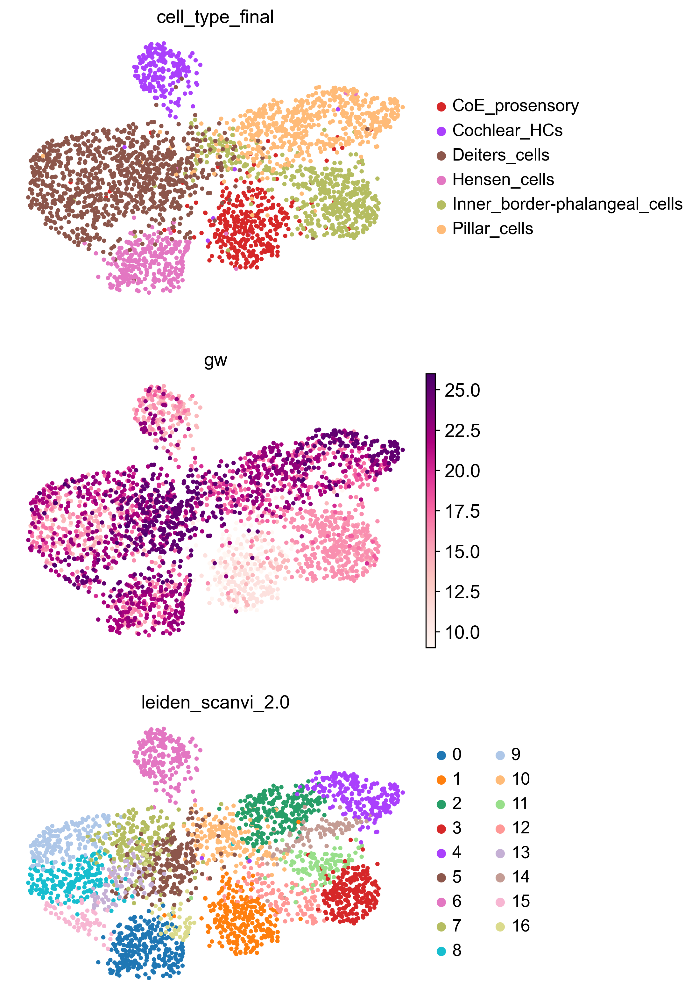

In [286]:
adata_scanvi = adata_scvi.copy()
adata_scanvi.obsm["X_scANVI"] = model_scanvi.get_latent_representation()
sc.pp.neighbors(adata_scanvi, use_rep="X_scANVI",n_neighbors=30)#n_neighbors=50
sc.tl.leiden(adata_scanvi,resolution=2,key_added = "leiden_scanvi_2.0")
sc.tl.umap(adata_scanvi,min_dist=0.4)#0.4
sc.pl.umap(adata_scanvi, color=['cell_type_final','gw','leiden_scanvi_2.0'], wspace=0.5,ncols=1)

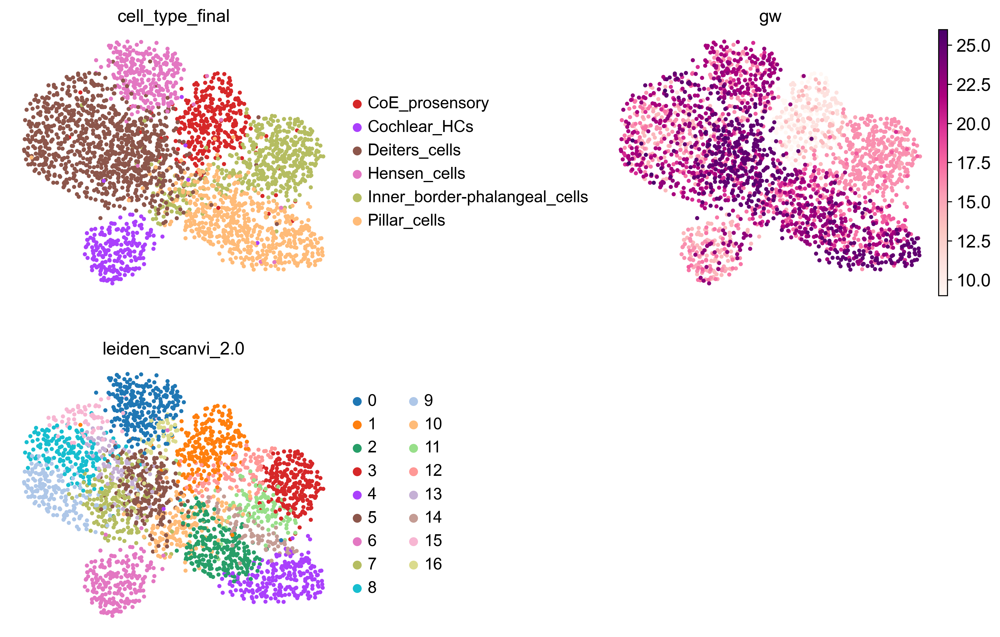

In [287]:
sc.pp.neighbors(adata_scanvi, use_rep="X_scANVI",n_neighbors=50)#n_neighbors=50
sc.tl.umap(adata_scanvi,min_dist=0.8)#0.4
sc.pl.umap(adata_scanvi, color=['cell_type_final','gw','leiden_scanvi_2.0',], wspace=0.65,ncols=2)

In [288]:
#Save latent space
pd.DataFrame(adata_scanvi.obsm["X_scANVI"]).to_csv('human_prosensory_all_XscANVI_latent_space.csv')

In [289]:
#Save latent space
pd.DataFrame(adata_scvi.obsm["X_scVI"]).to_csv('human_prosensory_all_XscVI_latent_space.csv')

In [290]:
#Load latent space scVI
X_scVI = pd.read_csv('human_prosensory_all_XscANVI_latent_space.csv', index_col=0)
adata_coe.obsm["X_scANVI"] = X_scVI.to_numpy()

In [291]:
#Load latent space scVI
X_scVI = pd.read_csv('human_prosensory_all_XscVI_latent_space.csv', index_col=0)
adata_coe.obsm["X_scVI"] = X_scVI.to_numpy()

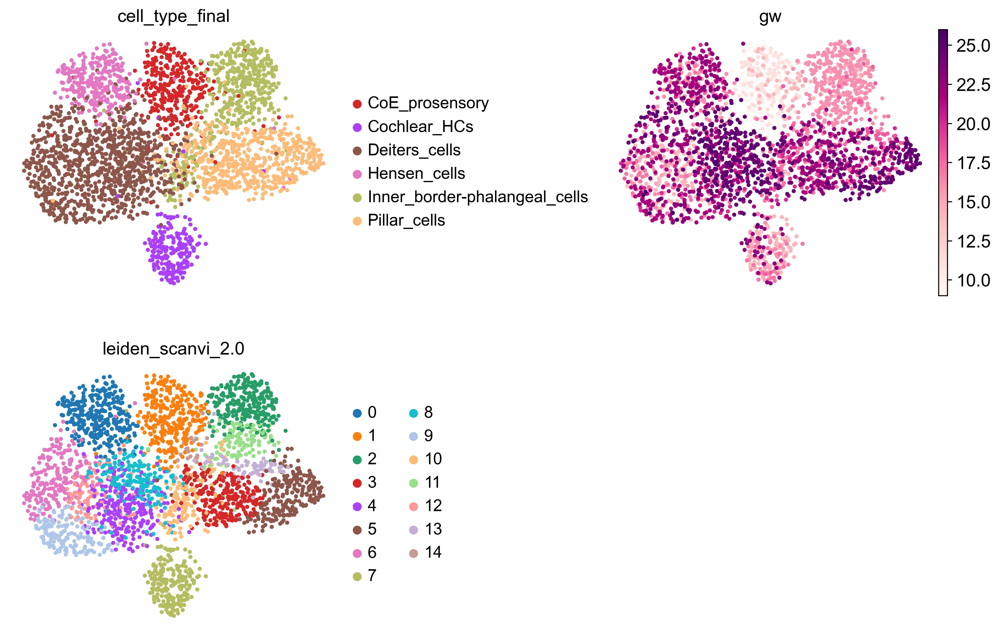

In [292]:
sc.pp.neighbors(adata_coe, use_rep="X_scANVI",n_neighbors=80)#n_neighbors=50
sc.tl.leiden(adata_coe,resolution=2,key_added = "leiden_scanvi_2.0")
sc.tl.umap(adata_coe,min_dist=0.6)#0.4
sc.pl.umap(adata_coe, color=['cell_type_final','gw','leiden_scanvi_2.0',], wspace=0.65,ncols=2)

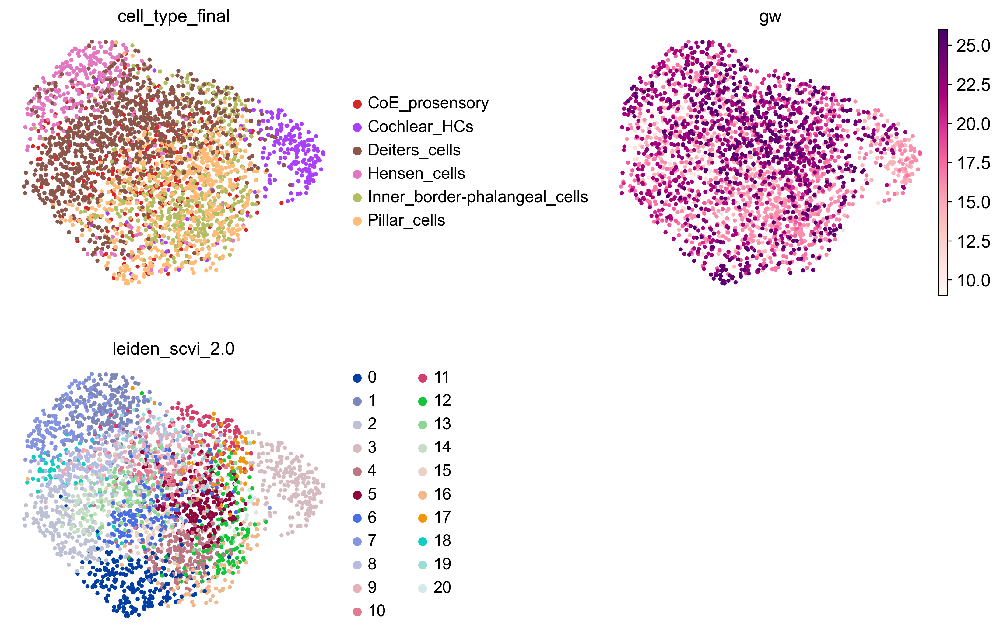

In [293]:
sc.pp.neighbors(adata_coe, use_rep="X_scVI",n_neighbors=50)#n_neighbors=50
sc.tl.leiden(adata_coe,resolution=2,key_added = "leiden_scvi_2.0")
sc.tl.umap(adata_coe,min_dist=0.6)#0.4
sc.pl.umap(adata_coe, color=['cell_type_final','gw','leiden_scvi_2.0',], wspace=0.65,ncols=2)

In [1]:
adata_coe.write('human_coe_for_trajectory_analysis.h5ad',compression='gzip')

NameError: name 'adata_coe' is not defined